# OpenCV Text Detection (EAST text detector)

### Import Packages

In [2]:
# import the necessary packages
from imutils.object_detection import non_max_suppression
from matplotlib import pyplot as plt
from imutils.video import FPS
import numpy as np
import argparse
import imutils
import time
import cv2

In [3]:
def plt_imshow(title, image):
  # convert the image frame BGR to RGB color space and display it
	image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
	plt.imshow(image)
	plt.title(title)
	plt.grid(False)
	plt.show()

### Text detection in images

In [4]:
args = {
	"image": "images/lebron_james.jpg",
	"east": "frozen_east_text_detection.pb",
	"min_confidence": 0.5,
	"width": 320,
	"height": 320
}

In [5]:
# load the input image and grab the image dimensions
image = cv2.imread(args["image"])
orig = image.copy()
(H, W) = image.shape[:2]

# set the new width and height and then determine the ratio in change
# for both the width and height
(newW, newH) = (args["width"], args["height"])
rW = W / float(newW)
rH = H / float(newH)

# resize the image and grab the new image dimensions
image = cv2.resize(image, (newW, newH))
(H, W) = image.shape[:2]

In [6]:
# define the two output layer names for the EAST detector model that
# we are interested -- the first is the output probabilities and the
# second can be used to derive the bounding box coordinates of text
layerNames = [
	"feature_fusion/Conv_7/Sigmoid",
	"feature_fusion/concat_3"]

In [7]:
# load the pre-trained EAST text detector
print("[INFO] loading EAST text detector...")
net = cv2.dnn.readNet(args["east"])

# construct a blob from the image and then perform a forward pass of
# the model to obtain the two output layer sets
blob = cv2.dnn.blobFromImage(image, 1.0, (W, H),
	(123.68, 116.78, 103.94), swapRB=True, crop=False)
start = time.time()
net.setInput(blob)
(scores, geometry) = net.forward(layerNames)
end = time.time()

# show timing information on text prediction
print("[INFO] text detection took {:.6f} seconds".format(end - start))

[INFO] loading EAST text detector...
[INFO] text detection took 0.696831 seconds


In [8]:
# grab the number of rows and columns from the scores volume, then
# initialize our set of bounding box rectangles and corresponding
# confidence scores
(numRows, numCols) = scores.shape[2:4]
rects = []
confidences = []

# loop over the number of rows
for y in range(0, numRows):
	# extract the scores (probabilities), followed by the geometrical
	# data used to derive potential bounding box coordinates that
	# surround text
	scoresData = scores[0, 0, y]
	xData0 = geometry[0, 0, y]
	xData1 = geometry[0, 1, y]
	xData2 = geometry[0, 2, y]
	xData3 = geometry[0, 3, y]
	anglesData = geometry[0, 4, y]

	# loop over the number of columns
	for x in range(0, numCols):
		# if our score does not have sufficient probability, ignore it
		if scoresData[x] < args["min_confidence"]:
			continue
		# compute the offset factor as our resulting feature maps will
		# be 4x smaller than the input image
		(offsetX, offsetY) = (x * 4.0, y * 4.0)
		# extract the rotation angle for the prediction and then
		# compute the sin and cosine
		angle = anglesData[x]
		cos = np.cos(angle)
		sin = np.sin(angle)
		# use the geometry volume to derive the width and height of
		# the bounding box
		h = xData0[x] + xData2[x]
		w = xData1[x] + xData3[x]
		# compute both the starting and ending (x, y)-coordinates for
		# the text prediction bounding box
		endX = int(offsetX + (cos * xData1[x]) + (sin * xData2[x]))
		endY = int(offsetY - (sin * xData1[x]) + (cos * xData2[x]))
		startX = int(endX - w)
		startY = int(endY - h)
		# add the bounding box coordinates and probability score to
		# our respective lists
		rects.append((startX, startY, endX, endY))
		confidences.append(scoresData[x])

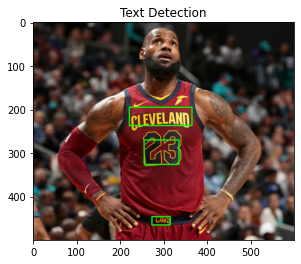

In [9]:
# apply non-maxima suppression to suppress weak, overlapping bounding
# boxes
boxes = non_max_suppression(np.array(rects), probs=confidences)

# loop over the bounding boxes
for (startX, startY, endX, endY) in boxes:
	# scale the bounding box coordinates based on the respective
	# ratios
	startX = int(startX * rW)
	startY = int(startY * rH)
	endX = int(endX * rW)
	endY = int(endY * rH)
 
	# draw the bounding box on the image
	cv2.rectangle(orig, (startX, startY), (endX, endY), (0, 255, 0), 2)

# show the output image
plt_imshow("Text Detection", orig)

### Text detection in video with OpenCV

In [10]:
# first, let's get a video on which we can perform text detection 
!wget https://colab-notebook-videos.s3-us-west-2.amazonaws.com/opencv+text+detection.mp4

--2021-05-25 20:32:44--  https://colab-notebook-videos.s3-us-west-2.amazonaws.com/opencv+text+detection.mp4
Resolving colab-notebook-videos.s3-us-west-2.amazonaws.com (colab-notebook-videos.s3-us-west-2.amazonaws.com)... 52.218.250.137
Connecting to colab-notebook-videos.s3-us-west-2.amazonaws.com (colab-notebook-videos.s3-us-west-2.amazonaws.com)|52.218.250.137|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 36195351 (35M) [video/mp4]
Saving to: ‘opencv+text+detection.mp4’

opencv+text+detecti 100%[===================>]  34.52M  44.6MB/s    in 0.8s    

2021-05-25 20:32:46 (44.6 MB/s) - ‘opencv+text+detection.mp4’ saved [36195351/36195351]



In [11]:
def decode_predictions(scores, geometry):
	# grab the number of rows and columns from the scores volume, then
	# initialize our set of bounding box rectangles and corresponding
	# confidence scores
	(numRows, numCols) = scores.shape[2:4]
	rects = []
	confidences = []

	# loop over the number of rows
	for y in range(0, numRows):
		# extract the scores (probabilities), followed by the
		# geometrical data used to derive potential bounding box
		# coordinates that surround text
		scoresData = scores[0, 0, y]
		xData0 = geometry[0, 0, y]
		xData1 = geometry[0, 1, y]
		xData2 = geometry[0, 2, y]
		xData3 = geometry[0, 3, y]
		anglesData = geometry[0, 4, y]

		# loop over the number of columns
		for x in range(0, numCols):
			# if our score does not have sufficient probability,
			# ignore it
			if scoresData[x] < args["min_confidence"]:
				continue

			# compute the offset factor as our resulting feature
			# maps will be 4x smaller than the input image
			(offsetX, offsetY) = (x * 4.0, y * 4.0)
   
			# extract the rotation angle for the prediction and
			# then compute the sin and cosine
			angle = anglesData[x]
			cos = np.cos(angle)
			sin = np.sin(angle)
   
			# use the geometry volume to derive the width and height
			# of the bounding box
			h = xData0[x] + xData2[x]
			w = xData1[x] + xData3[x]

			# compute both the starting and ending (x, y)-coordinates
			# for the text prediction bounding box
			endX = int(offsetX + (cos * xData1[x]) + (sin * xData2[x]))
			endY = int(offsetY - (sin * xData1[x]) + (cos * xData2[x]))
			startX = int(endX - w)
			startY = int(endY - h)
   
			# add the bounding box coordinates and probability score
			# to our respective lists
			rects.append((startX, startY, endX, endY))
			confidences.append(scoresData[x])
   
	# return a tuple of the bounding boxes and associated confidences
	return (rects, confidences)

In [12]:
args = {
	"east": "frozen_east_text_detection.pb",
    "video": "opencv+text+detection.mp4",
    "output": "output.avi",
	"min_confidence": 0.5,
	"width": 320,
	"height": 320
}

In [13]:
# initialize the original frame dimensions, new frame dimensions,
# and ratio between the dimensions
(W, H) = (None, None)
(newW, newH) = (args["width"], args["height"])
(rW, rH) = (None, None)

# define the two output layer names for the EAST detector model that
# we are interested -- the first is the output probabilities and the
# second can be used to derive the bounding box coordinates of text
layerNames = [
	"feature_fusion/Conv_7/Sigmoid",
	"feature_fusion/concat_3"]
    
# load the pre-trained EAST text detector
print("[INFO] loading EAST text detector...")
net = cv2.dnn.readNet(args["east"])

[INFO] loading EAST text detector...


In [14]:
# if a video path was not supplied, grab the reference to the web cam
if not args.get("video", False):
	print("[INFO] starting video stream...")
	vs = VideoStream(src=0).start()
	time.sleep(1.0)
 
# otherwise, grab a reference to the video file
else:
	vs = cv2.VideoCapture(args["video"])

# initialize pointer to output video file and start the FPS
# throughput estimator
writer = None
fps = FPS().start()

In [15]:
# loop over frames from the video stream
while True:
	# grab the current frame, then handle if we are using a
	# VideoStream or VideoCapture object
	frame = vs.read()
	frame = frame[1] if args.get("video", False) else frame

	# check to see if we have reached the end of the stream
	if frame is None:
		break

	# resize the frame, maintaining the aspect ratio
	frame = imutils.resize(frame, width=1000)
	orig = frame.copy()
 
	# if our frame dimensions are None, we still need to compute the
	# ratio of old frame dimensions to new frame dimensions
	if W is None or H is None:
		(H, W) = frame.shape[:2]
		rW = W / float(newW)
		rH = H / float(newH)
  
	# resize the frame, this time ignoring aspect ratio
	frame = cv2.resize(frame, (newW, newH))
 
	# construct a blob from the frame and then perform a forward pass
	# of the model to obtain the two output layer sets
	blob = cv2.dnn.blobFromImage(frame, 1.0, (newW, newH),
		(123.68, 116.78, 103.94), swapRB=True, crop=False)
	net.setInput(blob)
	(scores, geometry) = net.forward(layerNames)
 
	# decode the predictions, then  apply non-maxima suppression to
	# suppress weak, overlapping bounding boxes
	(rects, confidences) = decode_predictions(scores, geometry)
	boxes = non_max_suppression(np.array(rects), probs=confidences)
 
	# loop over the bounding boxes
	for (startX, startY, endX, endY) in boxes:
		# scale the bounding box coordinates based on the respective
		# ratios
		startX = int(startX * rW)
		startY = int(startY * rH)
		endX = int(endX * rW)
		endY = int(endY * rH)
  
		# draw the bounding box on the frame
		cv2.rectangle(orig, (startX, startY), (endX, endY), (0, 255, 0), 2)
  
	# update the FPS counter
	fps.update()
 
  # if the video writer is None *AND* we are supposed to write
	# the output video to disk initialize the writer
	if writer is None and args["output"] is not None:
		fourcc = cv2.VideoWriter_fourcc(*"MJPG")
		writer = cv2.VideoWriter(args["output"], fourcc, 20,
			(orig.shape[1], orig.shape[0]), True)
  
	# if the writer is not None, write the frame with recognized
	# faces to disk
	if writer is not None:
		writer.write(orig)

# stop the timer and display FPS information
fps.stop()
print("[INFO] elasped time: {:.2f}".format(fps.elapsed()))
print("[INFO] approx. FPS: {:.2f}".format(fps.fps()))

# if we are using a webcam, release the pointer
if not args.get("video", False):
	vs.stop()
 
# otherwise, release the file pointer
else:
	vs.release()
 
# check to see if the video writer point needs to be released
if writer is not None:
	writer.release()

[INFO] elasped time: 718.71
[INFO] approx. FPS: 1.69


The above code block takes a while to complete its execution.

Our output video is produced in `.avi` format. First, we need to convert it to `.mp4` format. 

In [16]:
!ffmpeg -i "output.avi" output.mp4

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

In [17]:
#@title Display video inline
from IPython.display import HTML
from base64 import b64encode

mp4 = open("output.mp4", "rb").read()
dataURL = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % dataURL)